Task1——学习笔记  
1. 如何分析赛题，如何学习（例如：由本题的评价指标延伸到其他的评价指标。疑问：各种评价指标的作用。）  
2. 如何分析赛题？首先将问题分类：回归？分类？总结常用的评价指标与使用方法。  
     
---
Task2——EDA     
1. 什么是EDA？为什么要做EDA？EDA要怎么做？              
2. 主要了解数据什么？缺失值、异常值？特征与预测值之间的关系？  
还是说，了解每个数据，那了解的具体方法是什么？（使用统计学知识，每个数据unique，箱型图分布，频数图）   

**缺失值处理：**     
* 补充、删除（判断依据是数量是否过多）       
* 缺省可视化介绍(这里应该是缺失值可视化)  
https://blog.csdn.net/weixin_43172660/article/details/83793084       
用于查看数据缺失值,白线代表缺失值。    
* 查找异常值方式, 异常值介绍的方法很少(在hp比赛中，通过各变量与目标值的线性回归来判断缺失值)    
* 怎么看出这两个数据严重倾斜？31个特征一个一个提取？类似Train_data["seller"].value_counts()，一个一个取看偏移是否严重吗？　　
通过data.discribe()的中25%、50%、75%那几个数据。   
* data.discribe()显示部分列
显示所有列    
pd.set_option('display.max_columns', None)  
#显示所有行  
pd.set_option('display.max_rows', None)  
#设置value的显示长度为100，默认为50  
pd.set_option('max_colwidth',100)  

**预测值分析：**  
* 在train_date数据集中，为什么对预测值进行Johnson SU, normal, log分布？    
* 正态分布的x轴与y轴分别代表？
* 对category类型分析。　
箱型图的使用：单一维度箱型图，多个维度箱型图
参考：https://www.cnblogs.com/wyy1480/p/9526264.html
缺省可视化介绍(这里应该是缺失值可视化)
https://blog.csdn.net/weixin_43172660/article/details/83793084
用于查看数据缺失值,白线代表缺失值

In [1]:
# # 查看数据文件目录  list datalab files
# !ls datalab/
# # 查看个人永久空间文件  list files in your permanent storage
# !ls /home/tianchi/myspace/
# # 查看当前kernel下已安装的包  list packages
# !pip list --format=columns

In [1]:
# 各种函数库
#coding:utf-8
#导入warnings包，利用过滤器来实现忽略警告语句。
import warnings
warnings.filterwarnings('ignore')
# 查看当前运行环境
import sys
print(sys.executable)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno

/home/xyz/anaconda3/envs/ds/bin/python


In [3]:
# 数据集信息
#     name - 汽车编码
#     regDate - 汽车注册时间
#     model - 车型编码
#     brand - 品牌
#     bodyType - 车身类型
#     fuelType - 燃油类型
#     gearbox - 变速箱
#     power - 汽车功率
#     kilometer - 汽车行驶公里
#     notRepairedDamage - 汽车有尚未修复的损坏
#     regionCode - 看车地区编码
#     seller - 销售方
#     offerType - 报价类型
#     creatDate - 广告发布时间
#     price - 汽车价格
#     v_0', 'v_1', 'v_2', 'v_3', 'v_4', 'v_5', 'v_6', 'v_7', 'v_8', 'v_9', 'v_10', 'v_11', 'v_12', 'v_13','v_14' 【匿名特征，包含v0-14在内15个匿名特征】

0. 总览数据  
* 全部数据都为数值型，虽然通过info()查看'notRepairedDamage'为object类型，但是实际还是数值。  
* 通过describe()可以看出，bodyType、fuelType、gearbox有缺失值，seller、offerType类型单一可能要删除。  
* 类别数据已被初步处理，全部都变成int类型。

In [4]:
# 读取数据
# path = "./datalab/231784/"
path = "../dataSet/"
Train_data = pd.read_csv(path+'used_car_train_20200313.csv', sep=' ')
Test_data = pd.read_csv(path+'used_car_testA_20200313.csv', sep=' ')

In [5]:
# 查看train数据
# 显示所有列
pd.set_option('display.max_columns', None)
Train_data.head()

,SaleID,name,regDate,model,brand,bodyType,fuelType,gearbox,power,kilometer,notRepairedDamage,regionCode,seller,offerType,creatDate,price,v_0,v_1,v_2,v_3,v_4,v_5,v_6,v_7,v_8,v_9,v_10,v_11,v_12,v_13,v_14
0,0,736,20040402,30.0,6,1.0,0.0,0.0,60,12.5,0.0,1046,0,0,20160404,1850,43.357796,3.966344,0.050257,2.159744,1.143786,0.235676,0.101988,0.129549,0.022816,0.097462,-2.881803,2.804097,-2.420821,0.795292,0.914762
1,1,2262,20030301,40.0,1,2.0,0.0,0.0,0,15.0,-,4366,0,0,20160309,3600,45.305273,5.236112,0.137925,1.380657,-1.422165,0.264777,0.121004,0.135731,0.026597,0.020582,-4.900482,2.096338,-1.030483,-1.722674,0.245522
2,2,14874,20040403,115.0,15,1.0,0.0,0.0,163,12.5,0.0,2806,0,0,20160402,6222,45.978359,4.823792,1.319524,-0.998467,-0.996911,0.251410,0.114912,0.165147,0.062173,0.027075,-4.846749,1.803559,1.565330,-0.832687,-0.229963
3,3,71865,19960908,109.0,10,0.0,0.0,1.0,193,15.0,0.0,434,0,0,20160312,2400,45.687478,4.492574,-0.050616,0.883600,-2.228079,0.274293,0.110300,0.121964,0.033395,0.000000,-4.509599,1.285940,-0.501868,-2.438353,-0.478699
4,4,111080,20120103,110.0,5,1.0,0.0,0.0,68,5.0,0.0,6977,0,0,20160313,5200,44.383511,2.031433,0.572169,-1.571239,2.246088,0.228036,0.073205,0.091880,0.078819,0.121534,-1.896240,0.910783,0.931110,2.834518,1.923482


In [6]:
# 查看train数据
Test_data.head()
# 可以看出test数据集比train数据集少了预测值-price

,SaleID,name,regDate,model,brand,bodyType,fuelType,gearbox,power,kilometer,notRepairedDamage,regionCode,seller,offerType,creatDate,v_0,v_1,v_2,v_3,v_4,v_5,v_6,v_7,v_8,v_9,v_10,v_11,v_12,v_13,v_14
0,150000,66932,20111212,222.0,4,5.0,1.0,1.0,313,15.0,0.0,1440,0,0,20160329,49.593127,5.246568,1.001130,-4.122264,0.737532,0.264405,0.121800,0.070899,0.106558,0.078867,-7.050969,-0.854626,4.800151,0.620011,-3.664654
1,150001,174960,19990211,19.0,21,0.0,0.0,0.0,75,12.5,1.0,5419,0,0,20160404,42.395926,-3.253950,-1.753754,3.646605,-0.725597,0.261745,0.000000,0.096733,0.013705,0.052383,3.679418,-0.729039,-3.796107,-1.541230,-0.757055
2,150002,5356,20090304,82.0,21,0.0,0.0,0.0,109,7.0,0.0,5045,0,0,20160308,45.841370,4.704178,0.155391,-1.118443,-0.229160,0.260216,0.112081,0.078082,0.062078,0.050540,-4.926690,1.001106,0.826562,0.138226,0.754033
3,150003,50688,20100405,0.0,0,0.0,0.0,1.0,160,7.0,0.0,4023,0,0,20160325,46.440649,4.319155,0.428897,-2.037916,-0.234757,0.260466,0.106727,0.081146,0.075971,0.048268,-4.864637,0.505493,1.870379,0.366038,1.312775
4,150004,161428,19970703,26.0,14,2.0,0.0,0.0,75,15.0,0.0,3103,0,0,20160309,42.184604,-3.166234,-1.572058,2.604143,0.387498,0.250999,0.000000,0.077806,0.028600,0.081709,3.616475,-0.673236,-3.197685,-0.025678,-0.101290


In [7]:
# 具体了解两个数据集的信息
print("train info:")
Train_data.info()
print("-------------------------")
print("test info:")
Test_data.info()

train info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150000 entries, 0 to 149999
Data columns (total 31 columns):
SaleID               150000 non-null int64
name                 150000 non-null int64
regDate              150000 non-null int64
model                149999 non-null float64
brand                150000 non-null int64
bodyType             145494 non-null float64
fuelType             141320 non-null float64
gearbox              144019 non-null float64
power                150000 non-null int64
kilometer            150000 non-null float64
notRepairedDamage    150000 non-null object
regionCode           150000 non-null int64
seller               150000 non-null int64
offerType            150000 non-null int64
creatDate            150000 non-null int64
price                150000 non-null int64
v_0                  150000 non-null float64
v_1                  150000 non-null float64
v_2                  150000 non-null float64
v_3                  150000 non-null float6

In [8]:
# 两个数据集统计信息
print("train description:")
Train_data.describe()

train description:


,SaleID,name,regDate,model,brand,bodyType,fuelType,gearbox,power,kilometer,regionCode,seller,offerType,creatDate,price,v_0,v_1,v_2,v_3,v_4,v_5,v_6,v_7,v_8,v_9,v_10,v_11,v_12,v_13,v_14
count,150000.000000,150000.000000,1.500000e+05,149999.000000,150000.000000,145494.000000,141320.000000,144019.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.0,1.500000e+05,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000
mean,74999.500000,68349.172873,2.003417e+07,47.129021,8.052733,1.792369,0.375842,0.224943,119.316547,12.597160,2583.077267,0.000007,0.0,2.016033e+07,5923.327333,44.406268,-0.044809,0.080765,0.078833,0.017875,0.248204,0.044923,0.124692,0.058144,0.061996,-0.001000,0.009035,0.004813,0.000313,-0.000688
std,43301.414527,61103.875095,5.364988e+04,49.536040,7.864956,1.760640,0.548677,0.417546,177.168419,3.919576,1885.363218,0.002582,0.0,1.067328e+02,7501.998477,2.457548,3.641893,2.929618,2.026514,1.193661,0.045804,0.051743,0.201410,0.029186,0.035692,3.772386,3.286071,2.517478,1.288988,1.038685
min,0.000000,0.000000,1.991000e+07,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.500000,0.000000,0.000000,0.0,2.015062e+07,11.000000,30.451976,-4.295589,-4.470671,-7.275037,-4.364565,0.000000,0.000000,0.000000,0.000000,0.000000,-9.168192,-5.558207,-9.639552,-4.153899,-6.546556
25%,37499.750000,11156.000000,1.999091e+07,10.000000,1.000000,0.000000,0.000000,0.000000,75.000000,12.500000,1018.000000,0.000000,0.0,2.016031e+07,1300.000000,43.135799,-3.192349,-0.970671,-1.462580,-0.921191,0.243615,0.000038,0.062474,0.035334,0.033930,-3.722303,-1.951543,-1.871846,-1.057789,-0.437034
50%,74999.500000,51638.000000,2.003091e+07,30.000000,6.000000,1.000000,0.000000,0.000000,110.000000,15.000000,2196.000000,0.000000,0.0,2.016032e+07,3250.000000,44.610266,-3.052671,-0.382947,0.099722,-0.075910,0.257798,0.000812,0.095866,0.057014,0.058484,1.624076,-0.358053,-0.130753,-0.036245,0.141246
75%,112499.250000,118841.250000,2.007111e+07,66.000000,13.000000,3.000000,1.000000,0.000000,150.000000,15.000000,3843.000000,0.000000,0.0,2.016033e+07,7700.000000,46.004721,4.000670,0.241335,1.565838,0.868758,0.265297,0.102009,0.125243,0.079382,0.087491,2.844357,1.255022,1.776933,0.942813,0.680378
max,149999.000000,196812.000000,2.015121e+07,247.000000,39.000000,7.000000,6.000000,1.000000,19312.000000,15.000000,8120.000000,1.000000,0.0,2.016041e+07,99999.000000,52.304178,7.320308,19.035496,9.854702,6.829352,0.291838,0.151420,1.404936,0.160791,0.222787,12.357011,18.819042,13.847792,11.147669,8.658418


In [9]:
print("test description:")
Test_data.describe()

test description:


,SaleID,name,regDate,model,brand,bodyType,fuelType,gearbox,power,kilometer,regionCode,seller,offerType,creatDate,v_0,v_1,v_2,v_3,v_4,v_5,v_6,v_7,v_8,v_9,v_10,v_11,v_12,v_13,v_14
count,50000.000000,50000.000000,5.000000e+04,50000.000000,50000.000000,48587.000000,47107.000000,48090.000000,50000.000000,50000.000000,50000.000000,50000.0,50000.0,5.000000e+04,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000
mean,174999.500000,68542.223280,2.003393e+07,46.844520,8.056240,1.782185,0.373405,0.224350,119.883620,12.595580,2590.604820,0.0,0.0,2.016033e+07,44.418233,-0.037238,0.050534,0.084640,0.015001,0.248669,0.045021,0.122744,0.057997,0.062000,-0.017855,-0.013742,-0.013554,-0.003147,0.001516
std,14433.901067,61052.808133,5.368870e+04,49.469548,7.819477,1.760736,0.546442,0.417158,185.097387,3.908979,1876.970263,0.0,0.0,7.951521e+01,2.429950,3.642562,2.856341,2.026510,1.193026,0.044601,0.051766,0.195972,0.029211,0.035653,3.747985,3.231258,2.515962,1.286597,1.027360
min,150000.000000,0.000000,1.991000e+07,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.500000,0.000000,0.0,0.0,2.015061e+07,28.987024,-4.137733,-4.205728,-5.638184,-4.287718,0.000000,0.000000,0.000000,0.000000,0.000000,-9.160049,-5.411964,-8.916949,-4.123333,-6.112667
25%,162499.750000,11203.500000,1.999091e+07,10.000000,1.000000,0.000000,0.000000,0.000000,75.000000,12.500000,1030.000000,0.0,0.0,2.016031e+07,43.139621,-3.191909,-0.971266,-1.453453,-0.928089,0.243762,0.000044,0.062644,0.035084,0.033714,-3.700121,-1.971325,-1.876703,-1.060428,-0.437920
50%,174999.500000,52248.500000,2.003091e+07,29.000000,6.000000,1.000000,0.000000,0.000000,109.000000,15.000000,2219.000000,0.0,0.0,2.016032e+07,44.611084,-3.050756,-0.388117,0.097881,-0.070225,0.257877,0.000815,0.095828,0.057084,0.058764,1.613212,-0.355843,-0.142779,-0.035956,0.138799
75%,187499.250000,118856.500000,2.007110e+07,65.000000,13.000000,3.000000,1.000000,0.000000,150.000000,15.000000,3857.000000,0.0,0.0,2.016033e+07,45.992639,3.997323,0.240548,1.562700,0.863731,0.265328,0.102025,0.125438,0.079077,0.087489,2.832708,1.262914,1.764335,0.941469,0.681163
max,199999.000000,196805.000000,2.015121e+07,246.000000,39.000000,7.000000,6.000000,1.000000,20000.000000,15.000000,8121.000000,0.0,0.0,2.016041e+07,51.751684,7.553517,18.394570,9.381599,5.270150,0.291618,0.153265,1.358813,0.156355,0.214775,12.338872,18.856218,12.950498,5.913273,2.624622


1. 缺失值  
* 进一步验证bodyType、fuelType、gearbox有缺失值。  

In [10]:
# 缺失值
Train_data.isnull().sum()

SaleID                  0
name                    0
regDate                 0
model                   1
brand                   0
bodyType             4506
fuelType             8680
gearbox              5981
power                   0
kilometer               0
notRepairedDamage       0
regionCode              0
seller                  0
offerType               0
creatDate               0
price                   0
v_0                     0
v_1                     0
v_2                     0
v_3                     0
v_4                     0
v_5                     0
v_6                     0
v_7                     0
v_8                     0
v_9                     0
v_10                    0
v_11                    0
v_12                    0
v_13                    0
v_14                    0
dtype: int64

In [11]:
# train与test缺失的一样,同为bodyType,fuelType,gearbox
Test_data.isnull().sum()

SaleID                  0
name                    0
regDate                 0
model                   0
brand                   0
bodyType             1413
fuelType             2893
gearbox              1910
power                   0
kilometer               0
notRepairedDamage       0
regionCode              0
seller                  0
offerType               0
creatDate               0
v_0                     0
v_1                     0
v_2                     0
v_3                     0
v_4                     0
v_5                     0
v_6                     0
v_7                     0
v_8                     0
v_9                     0
v_10                    0
v_11                    0
v_12                    0
v_13                    0
v_14                    0
dtype: int64

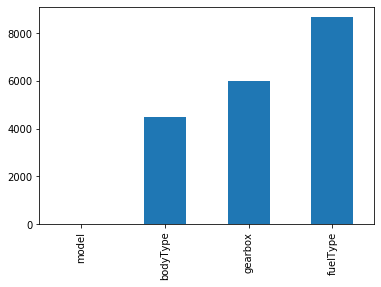

In [9]:
# 缺失值可视化1
miss_train = Train_data.isnull().sum() 
miss_train = miss_train[miss_train>0]
miss_train.sort_values(inplace=True)
miss_train.plot.bar()

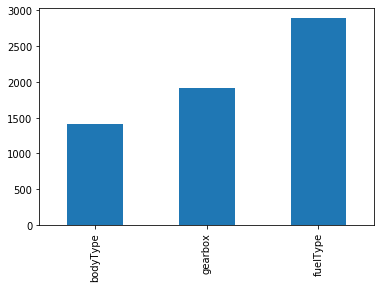

In [7]:
miss_test  =  Test_data.isnull().sum()
miss_test  =  miss_test[miss_test>0]
miss_test.sort_values(inplace=True)
miss_test.plot.bar()

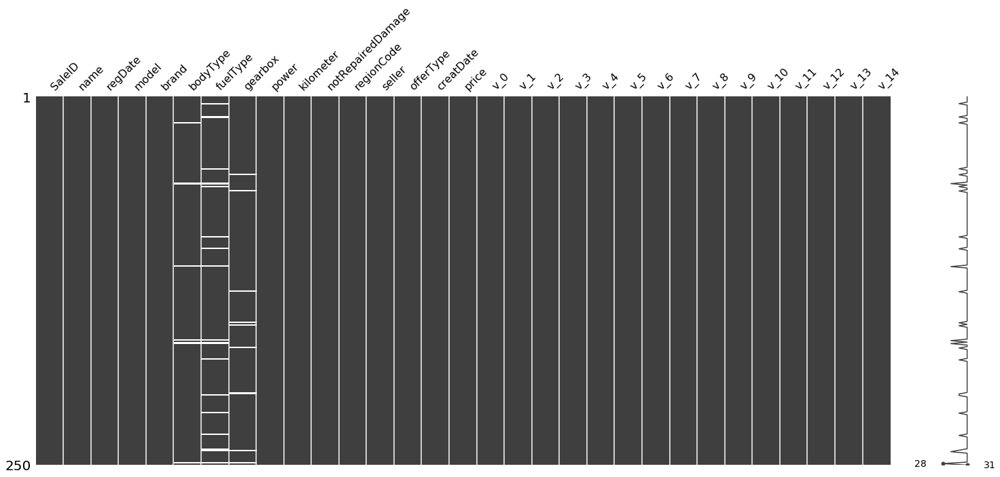

In [14]:
# 缺失值可视化2
# missingno库使用
msno.matrix(Train_data.sample(250))

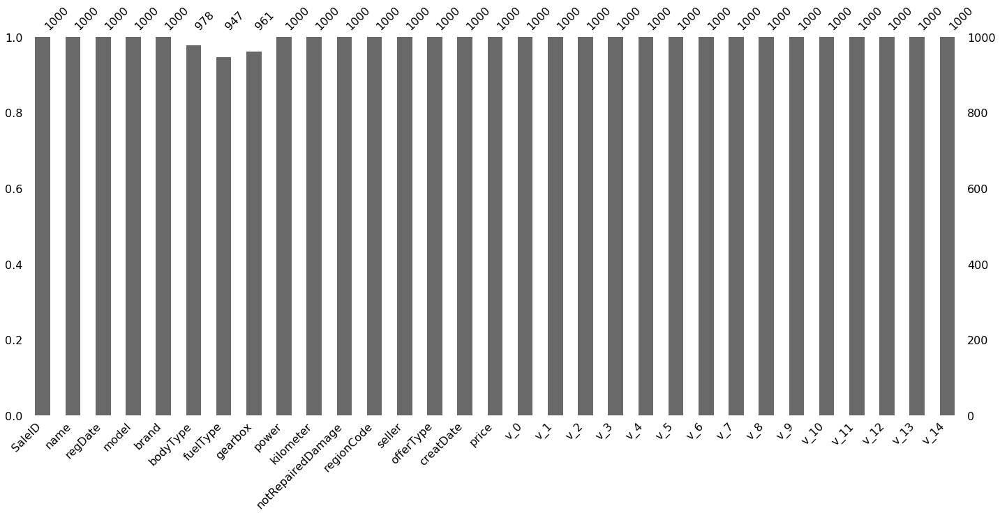

In [15]:
msno.bar(Train_data.sample(1000))

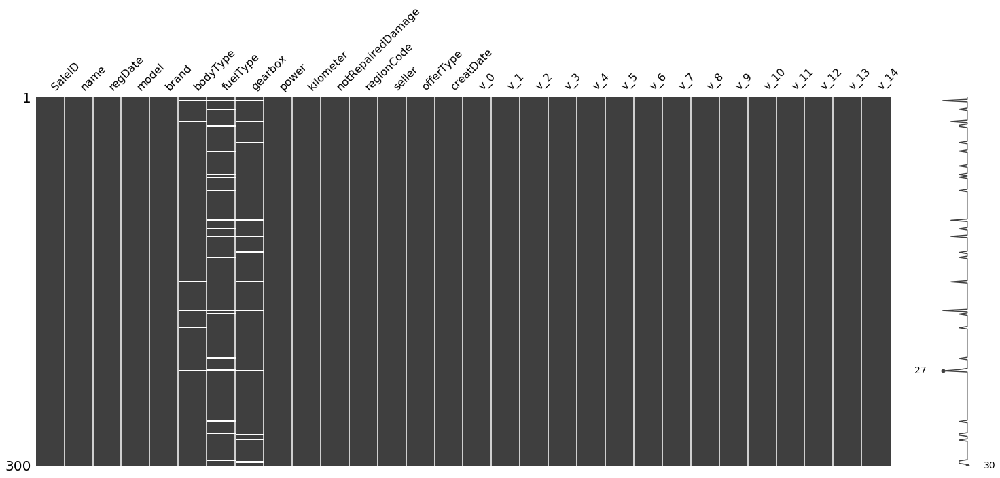

In [16]:
msno.matrix(Test_data.sample(300))

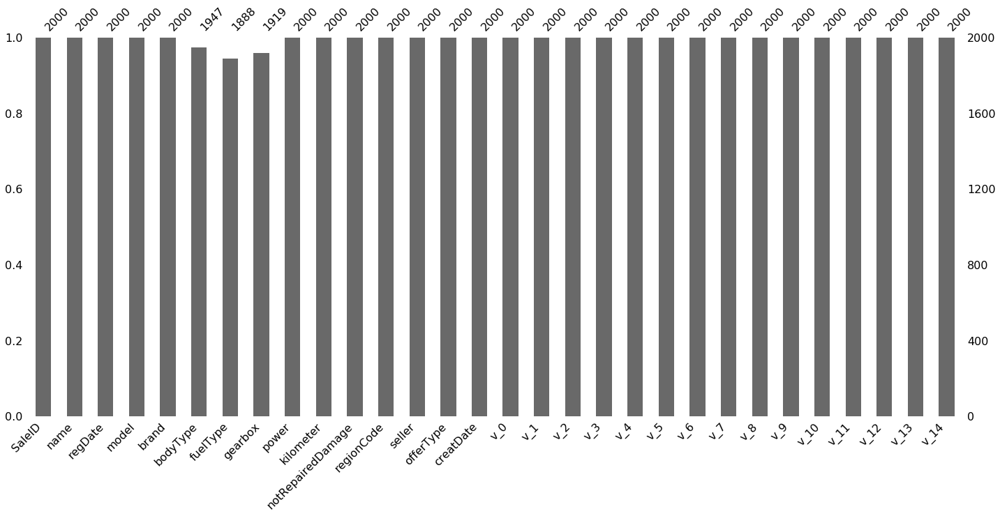

In [17]:
msno.bar(Test_data.sample(2000))

2. 异常值  
**在<u>0.总览数据</u>中，通过describe与info数据集，发现: **  
* 只有notRepairedDamage为object类型。  
* sellerType、offerType类型单一。  

In [18]:
# 两个数据集都只有'notRepairedDamage'为object, 我们来观察一下.
Train_data['notRepairedDamage'].head()

0    0.0
1      -
2    0.0
3    0.0
4    0.0
Name: notRepairedDamage, dtype: object

In [19]:
# 查看分布
Train_data['notRepairedDamage'].value_counts()

0.0    111361
-       24324
1.0     14315
Name: notRepairedDamage, dtype: int64

In [20]:
Test_data['notRepairedDamage'].value_counts()

0.0    37249
-       8031
1.0     4720
Name: notRepairedDamage, dtype: int64

In [21]:
# 通过以上两个步骤发现notRepairedDamage值的类型为0和1，并且还有缺失值。
# 将'-'替换成'nan'，便于识别。
# Train_data['notRepairedDamage'].replace('-', np.nan, inplace=True)
# 这里可以把notRepairedDamage中的Object变成int型，这样方便查看下面分布图。
Train_data['notRepairedDamage'].replace('-',"nan",inplace=True)
Test_data['notRepairedDamage'].replace('-',"nan",inplace=True)

In [22]:
type(Train_data['notRepairedDamage'][1])

str

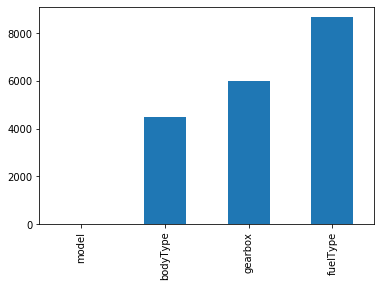

In [23]:
# 再次验证缺失值
# 可以发现处理后的notRepairedDamage也是存在缺失值的
miss_train = Train_data.isnull().sum() 
miss_train = miss_train[miss_train>0]
miss_train.sort_values(inplace=True)
miss_train.plot.bar()

In [24]:
# 探索seller与offerType。
# 这俩个维度严重倾斜，在特征工程的时候可以考虑去除掉。
Train_data['seller'].value_counts()

0    149999
1         1
Name: seller, dtype: int64

In [25]:
Test_data['seller'].value_counts()

0    50000
Name: seller, dtype: int64

In [26]:
Train_data['offerType'].value_counts()

0    150000
Name: offerType, dtype: int64

In [27]:
Test_data['offerType'].value_counts()

0    50000
Name: offerType, dtype: int64

3. 预测值探索  
* 本小结观察了预测值与其他维度的偏度与峰度。这步操作的意义是什么？  
* 对预测值进行了log转换，为什么？为了契合算法的先决条件？    
后面要调查各个算法的使用前提。    

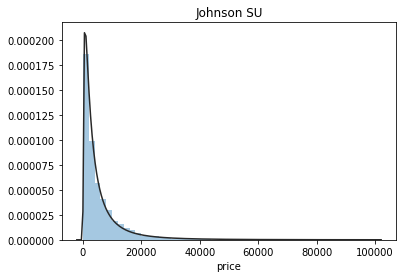

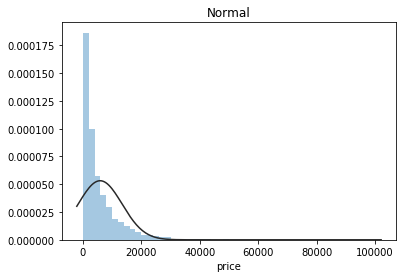

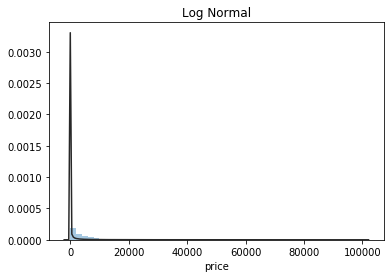

In [28]:
## 1) 总体分布概况（无界约翰逊分布等）
import scipy.stats as st
y = Train_data['price']
plt.figure(1); plt.title('Johnson SU')
sns.distplot(y, kde=False, fit=st.johnsonsu)
plt.figure(2); plt.title('Normal')
sns.distplot(y, kde=False, fit=st.norm)
plt.figure(3); plt.title('Log Normal')
sns.distplot(y, kde=False, fit=st.lognorm)

Skewness: 3.346487
Kurtosis: 18.995183


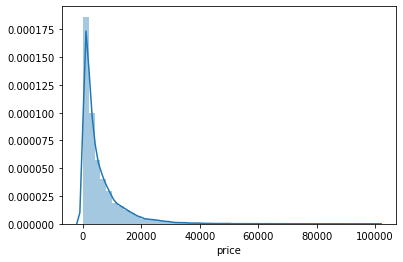

In [29]:
## 2) 查看skewness and kurtosis
# price
sns.distplot(Train_data['price']);
print("Skewness: %f" % Train_data['price'].skew())
print("Kurtosis: %f" % Train_data['price'].kurt())

In [30]:
# 其他维度
print("skew:")
a = Train_data.skew()
print(a)
print("\n")
print("kurt:")
b = Train_data.kurt()
print(b)

skew:
SaleID               6.017846e-17
name                 5.576058e-01
regDate              2.849508e-02
model                1.484388e+00
brand                1.150760e+00
bodyType             9.915299e-01
fuelType             1.595486e+00
gearbox              1.317514e+00
power                6.586318e+01
kilometer           -1.525921e+00
notRepairedDamage             NaN
regionCode           6.888812e-01
seller               3.872983e+02
offerType            0.000000e+00
creatDate           -7.901331e+01
price                3.346487e+00
v_0                 -1.316712e+00
v_1                  3.594543e-01
v_2                  4.842556e+00
v_3                  1.062920e-01
v_4                  3.679890e-01
v_5                 -4.737094e+00
v_6                  3.680730e-01
v_7                  5.130233e+00
v_8                  2.046133e-01
v_9                  4.195007e-01
v_10                 2.522046e-02
v_11                 3.029146e+00
v_12                 3.653576e-01
v_13    

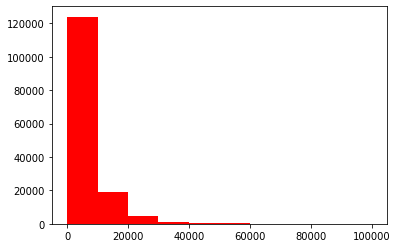

In [31]:
plt.hist(Train_data['price'], orientation = 'vertical',histtype = 'bar', color ='red')
plt.show()

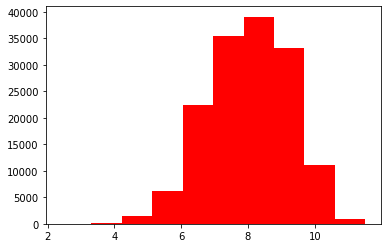

In [32]:
# log变换 z之后的分布较均匀，可以进行log变换进行预测，这也是预测问题常用的trick
plt.hist(np.log(Train_data['price']), orientation = 'vertical',histtype = 'bar', color ='red') 
plt.show()

In [33]:
# Train_data['model'].value_counts().plot(kind='bar')
# Train_data['notRepairedDamage'].hist()

# print('fuelType' + "的特征分布如下：")
# print("{}特征有个{}不同的值".format('fuelType', Train_data['fuelType'].nunique()))
# plt.hist(Train_data['fuelType'], orientation = 'vertical',histtype = 'bar')
# plt.show()

4. 数据分类：定性数据与定量数据   
* 通过分布图与箱型图，到底可以对后面特征工程有什么帮助。   

In [34]:
# 全部列信息
all_columns = Train_data.columns
all_columns

Index(['SaleID', 'name', 'regDate', 'model', 'brand', 'bodyType', 'fuelType',
       'gearbox', 'power', 'kilometer', 'notRepairedDamage', 'regionCode',
       'seller', 'offerType', 'creatDate', 'price', 'v_0', 'v_1', 'v_2', 'v_3',
       'v_4', 'v_5', 'v_6', 'v_7', 'v_8', 'v_9', 'v_10', 'v_11', 'v_12',
       'v_13', 'v_14'],
      dtype='object')

In [35]:
# numeric_features为定量数据
numeric_features = ['power', 'kilometer', 'v_0', 'v_1', 'v_2', 'v_3', 'v_4', 'v_5', 'v_6', 'v_7', 'v_8', 'v_9', 'v_10', 'v_11', 'v_12', 'v_13','v_14' ]
# categorical_features为定性数据
categorical_features = ['name', 'model', 'brand', 'bodyType', 'fuelType', 'gearbox', 'notRepairedDamage', 'regionCode',]

name的特征分布如下：
name特征有个99662不同的值


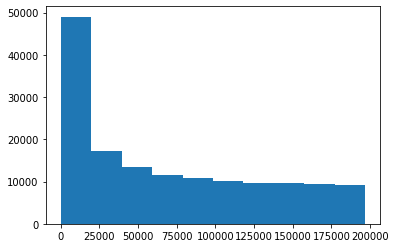

model的特征分布如下：
model特征有个248不同的值


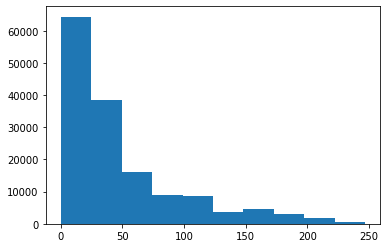

brand的特征分布如下：
brand特征有个40不同的值


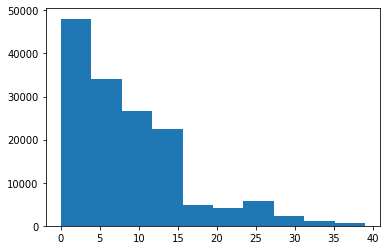

bodyType的特征分布如下：
bodyType特征有个8不同的值


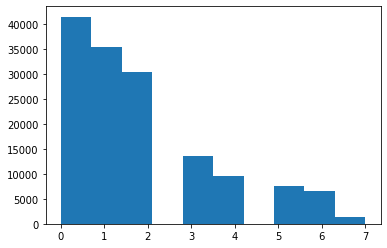

fuelType的特征分布如下：
fuelType特征有个7不同的值


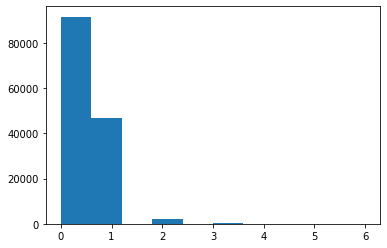

gearbox的特征分布如下：
gearbox特征有个2不同的值


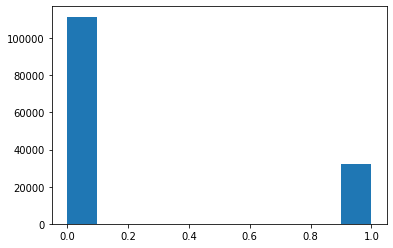

notRepairedDamage的特征分布如下：
notRepairedDamage特征有个3不同的值


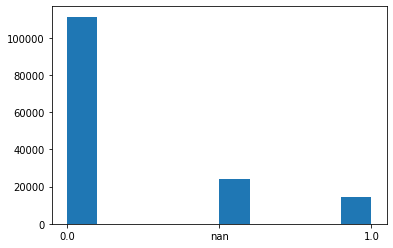

regionCode的特征分布如下：
regionCode特征有个7905不同的值


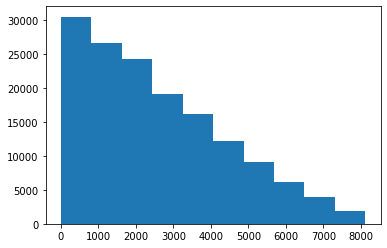

In [36]:
# 4.1 查看各数据分布情况 
# 定性数据unique分布
for cat_fea in categorical_features:
    print(cat_fea + "的特征分布如下：")
    print("{}特征有个{}不同的值".format(cat_fea, Train_data[cat_fea].nunique()))
    plt.hist(Train_data[cat_fea])
    plt.show()

power的特征分布如下：


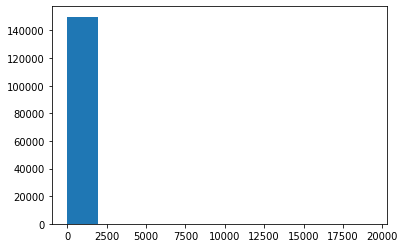

kilometer的特征分布如下：


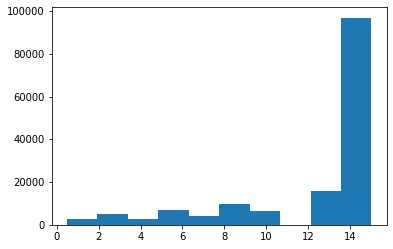

v_0的特征分布如下：


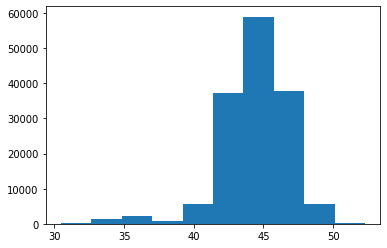

v_1的特征分布如下：


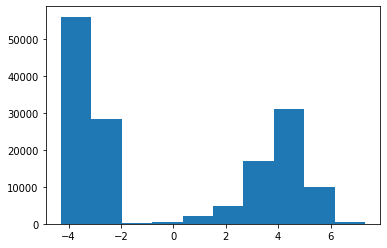

v_2的特征分布如下：


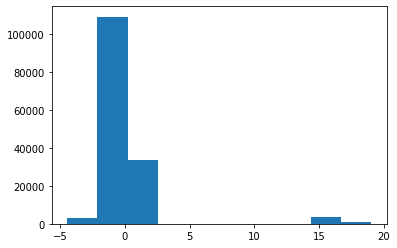

v_3的特征分布如下：


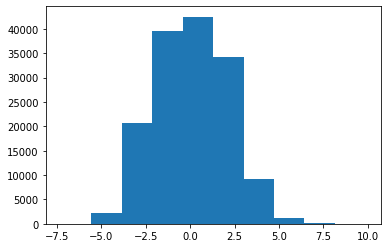

v_4的特征分布如下：


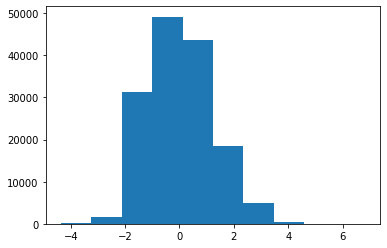

v_5的特征分布如下：


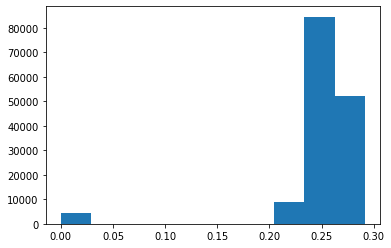

v_6的特征分布如下：


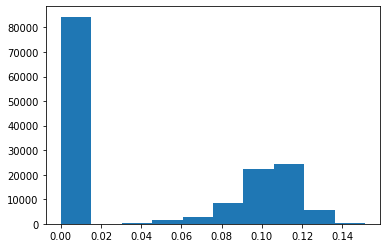

v_7的特征分布如下：


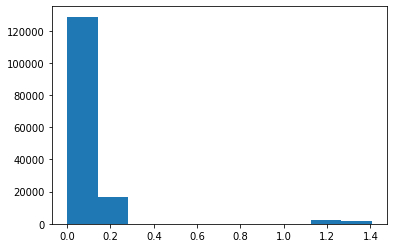

v_8的特征分布如下：


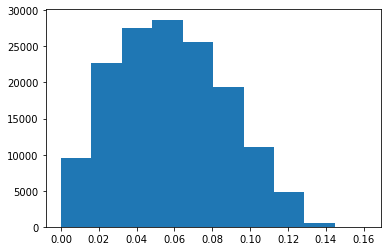

v_9的特征分布如下：


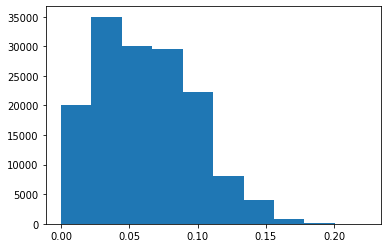

v_10的特征分布如下：


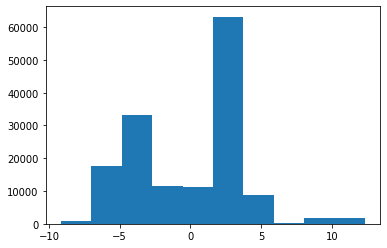

v_11的特征分布如下：


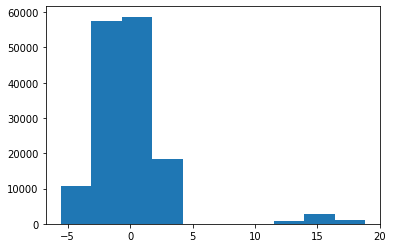

v_12的特征分布如下：


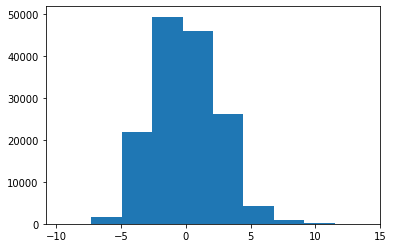

v_13的特征分布如下：


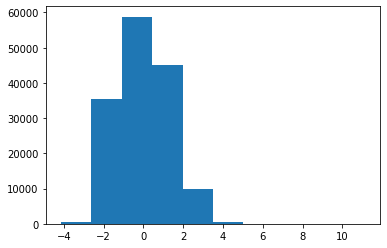

v_14的特征分布如下：


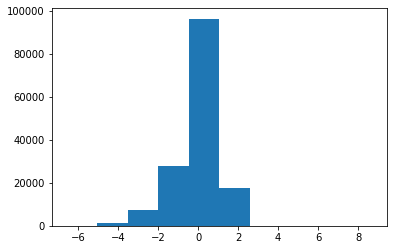

In [37]:
# 4.1 查看各数据分布情况 
# 定量数据unique分布
for num_fea in numeric_features:
    print(num_fea + "的特征分布如下：")
    plt.hist(Train_data[num_fea])
    plt.show()

In [38]:
# 4.2 定量特征具体分析
# 相关性
numeric_features.append('price')
numeric_features

['power',
 'kilometer',
 'v_0',
 'v_1',
 'v_2',
 'v_3',
 'v_4',
 'v_5',
 'v_6',
 'v_7',
 'v_8',
 'v_9',
 'v_10',
 'v_11',
 'v_12',
 'v_13',
 'v_14',
 'price']

In [39]:
## 1) 相关性分析
price_numeric = Train_data[numeric_features]
correlation = price_numeric.corr()
print(correlation['price'].sort_values(ascending = False),'\n')

price        1.000000
v_12         0.692823
v_8          0.685798
v_0          0.628397
power        0.219834
v_5          0.164317
v_2          0.085322
v_6          0.068970
v_1          0.060914
v_14         0.035911
v_13        -0.013993
v_7         -0.053024
v_4         -0.147085
v_9         -0.206205
v_10        -0.246175
v_11        -0.275320
kilometer   -0.440519
v_3         -0.730946
Name: price, dtype: float64 



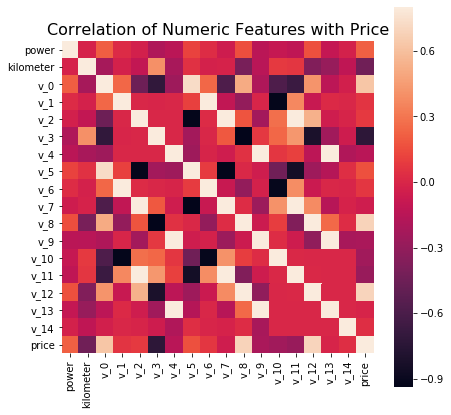

In [40]:
# 画图表示相关性
# 模型的基本假设条件：特征之间是相互独立的
f , ax = plt.subplots(figsize = (7, 7))
plt.title('Correlation of Numeric Features with Price',y=1,size=16)
sns.heatmap(correlation,square = True,  vmax=0.8)

In [41]:
del numeric_features[-1]
numeric_features

['power',
 'kilometer',
 'v_0',
 'v_1',
 'v_2',
 'v_3',
 'v_4',
 'v_5',
 'v_6',
 'v_7',
 'v_8',
 'v_9',
 'v_10',
 'v_11',
 'v_12',
 'v_13',
 'v_14']

In [42]:
## 2) 查看几个特征得 偏度和峰值
for col in numeric_features:
    print('{:15}'.format(col), 
          'Skewness: {:05.2f}'.format(Train_data[col].skew()) , 
          '   ' ,
          'Kurtosis: {:06.2f}'.format(Train_data[col].kurt())  
         )

power           Skewness: 65.86     Kurtosis: 5733.45
kilometer       Skewness: -1.53     Kurtosis: 001.14
v_0             Skewness: -1.32     Kurtosis: 003.99
v_1             Skewness: 00.36     Kurtosis: -01.75
v_2             Skewness: 04.84     Kurtosis: 023.86
v_3             Skewness: 00.11     Kurtosis: -00.42
v_4             Skewness: 00.37     Kurtosis: -00.20
v_5             Skewness: -4.74     Kurtosis: 022.93
v_6             Skewness: 00.37     Kurtosis: -01.74
v_7             Skewness: 05.13     Kurtosis: 025.85
v_8             Skewness: 00.20     Kurtosis: -00.64
v_9             Skewness: 00.42     Kurtosis: -00.32
v_10            Skewness: 00.03     Kurtosis: -00.58
v_11            Skewness: 03.03     Kurtosis: 012.57
v_12            Skewness: 00.37     Kurtosis: 000.27
v_13            Skewness: 00.27     Kurtosis: -00.44
v_14            Skewness: -1.19     Kurtosis: 002.39


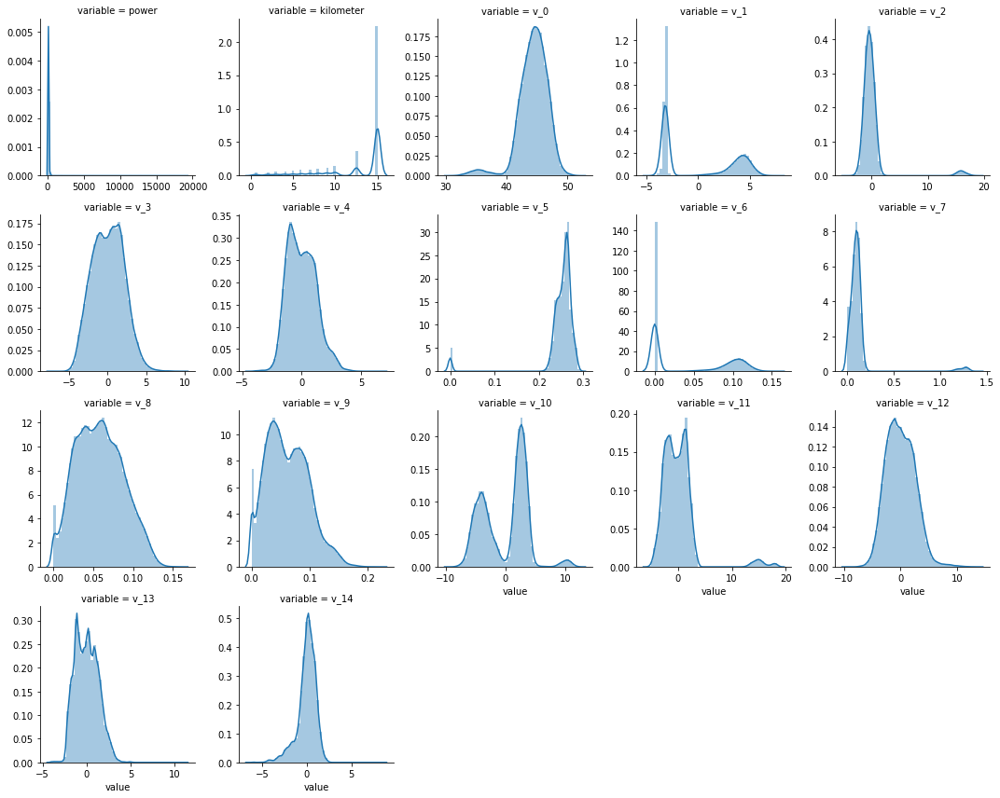

In [43]:
## 3) 每个数字特征得分布可视化，可能是概率密度函数？？？待查证
f = pd.melt(Train_data, value_vars=numeric_features)
g = sns.FacetGrid(f, col="variable",  col_wrap=5, sharex=False, sharey=False)
g = g.map(sns.distplot, "value")

In [44]:
# ## 4) 数字特征相互之间的关系可视化
sns.set()
# columns = ['price', 'v_12', 'v_8' , 'v_0', 'power', 'v_5',  'v_2', 'v_6', 'v_1', 'v_14']
columns = ['price', 'v_12', 'v_8']
sns.pairplot(Train_data[columns],height = 2 ,kind ='scatter',diag_kind='kde')
plt.show()

In [51]:
# ## 5) 多变量互相回归关系可视化
# fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6), (ax7, ax8), (ax9, ax10)) = plt.subplots(nrows=5, ncols=2, figsize=(24, 20))
# # ['v_12', 'v_8' , 'v_0', 'power', 'v_5',  'v_2', 'v_6', 'v_1', 'v_14']
# v_12_scatter_plot = pd.concat([Y_train,Train_data['v_12']],axis = 1)
# sns.regplot(x='v_12',y = 'price', data = v_12_scatter_plot,scatter= True, fit_reg=True, ax=ax1)

# v_8_scatter_plot = pd.concat([Y_train,Train_data['v_8']],axis = 1)
# sns.regplot(x='v_8',y = 'price',data = v_8_scatter_plot,scatter= True, fit_reg=True, ax=ax2)

# v_0_scatter_plot = pd.concat([Y_train,Train_data['v_0']],axis = 1)
# sns.regplot(x='v_0',y = 'price',data = v_0_scatter_plot,scatter= True, fit_reg=True, ax=ax3)

# power_scatter_plot = pd.concat([Y_train,Train_data['power']],axis = 1)
# sns.regplot(x='power',y = 'price',data = power_scatter_plot,scatter= True, fit_reg=True, ax=ax4)

# v_5_scatter_plot = pd.concat([Y_train,Train_data['v_5']],axis = 1)
# sns.regplot(x='v_5',y = 'price',data = v_5_scatter_plot,scatter= True, fit_reg=True, ax=ax5)

# v_2_scatter_plot = pd.concat([Y_train,Train_data['v_2']],axis = 1)
# sns.regplot(x='v_2',y = 'price',data = v_2_scatter_plot,scatter= True, fit_reg=True, ax=ax6)

# v_6_scatter_plot = pd.concat([Y_train,Train_data['v_6']],axis = 1)
# sns.regplot(x='v_6',y = 'price',data = v_6_scatter_plot,scatter= True, fit_reg=True, ax=ax7)

# v_1_scatter_plot = pd.concat([Y_train,Train_data['v_1']],axis = 1)
# sns.regplot(x='v_1',y = 'price',data = v_1_scatter_plot,scatter= True, fit_reg=True, ax=ax8)

# v_14_scatter_plot = pd.concat([Y_train,Train_data['v_14']],axis = 1)
# sns.regplot(x='v_14',y = 'price',data = v_14_scatter_plot,scatter= True, fit_reg=True, ax=ax9)

# v_13_scatter_plot = pd.concat([Y_train,Train_data['v_13']],axis = 1)
# sns.regplot(x='v_13',y = 'price',data = v_13_scatter_plot,scatter= True, fit_reg=True, ax=ax10)

In [ ]:
# 4.3 定性数据可视化：箱型图、小提琴图、柱状图、频数图

In [45]:
## 1) unique分布
for fea in categorical_features:
    print(fea + "的unique分布如下：")
    print(Train_data[fea].nunique())

name的unique分布如下：
99662
model的unique分布如下：
248
brand的unique分布如下：
40
bodyType的unique分布如下：
8
fuelType的unique分布如下：
7
gearbox的unique分布如下：
2
notRepairedDamage的unique分布如下：
3
regionCode的unique分布如下：
7905


/home/xy/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:230: UserWarning: The `size` paramter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


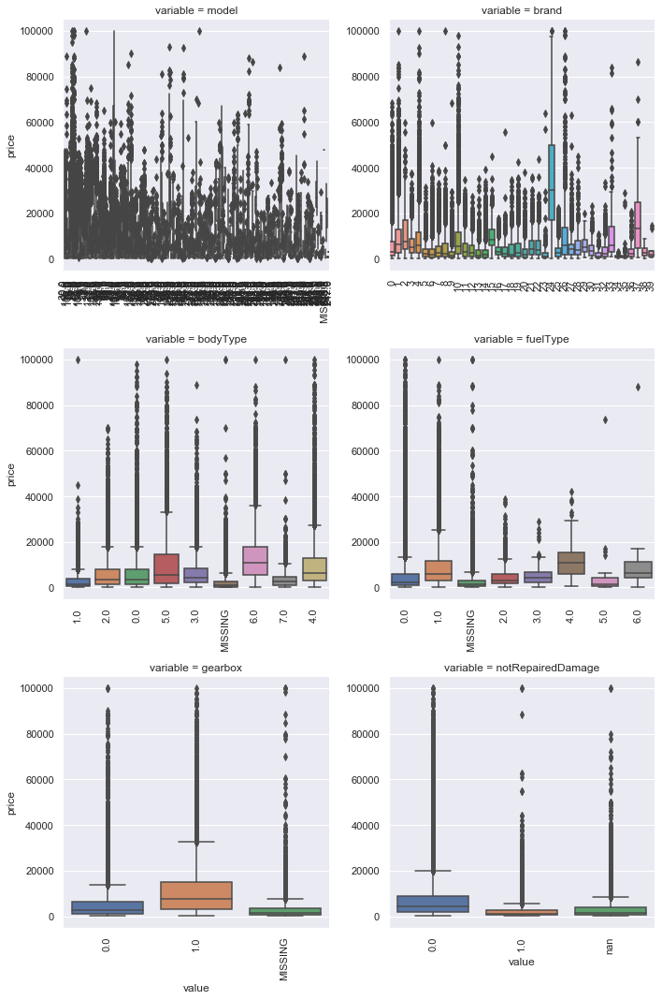

In [46]:
## 2) 箱形图
# 因为 name和 regionCode的类别太稀疏了，这里我们把不稀疏的几类画一下
categorical_features = ['model',
 'brand',
 'bodyType',
 'fuelType',
 'gearbox',
 'notRepairedDamage']
for c in categorical_features:
    Train_data[c] = Train_data[c].astype('category')
    if Train_data[c].isnull().any():
        Train_data[c] = Train_data[c].cat.add_categories(['MISSING'])
        Train_data[c] = Train_data[c].fillna('MISSING')

def boxplot(x, y, **kwargs):
    sns.boxplot(x=x, y=y)
    x=plt.xticks(rotation=90)

f = pd.melt(Train_data, id_vars=['price'], value_vars=categorical_features)
g = sns.FacetGrid(f, col="variable",  col_wrap=2, sharex=False, sharey=False, size=5)
g = g.map(boxplot, "value", "price")

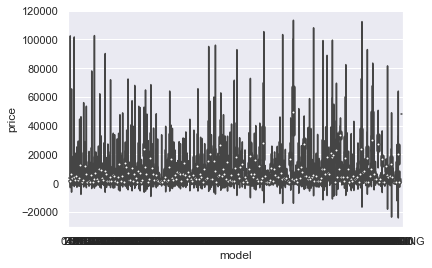

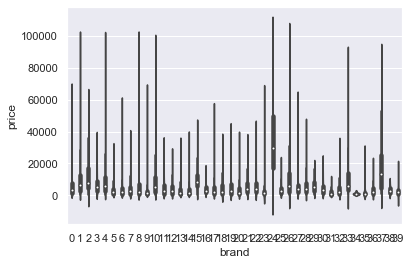

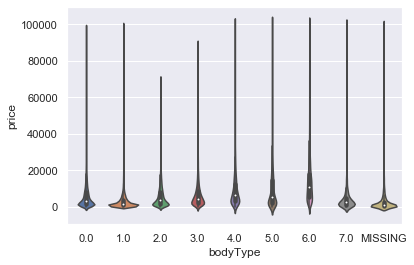

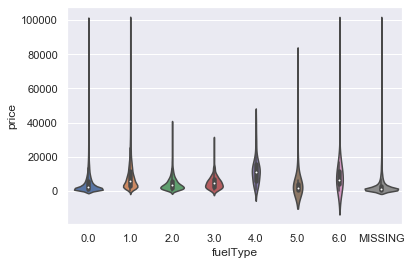

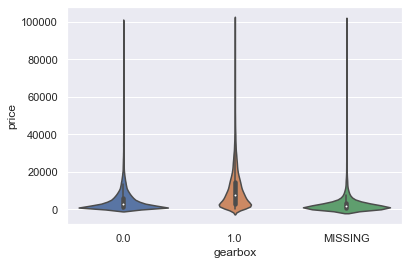

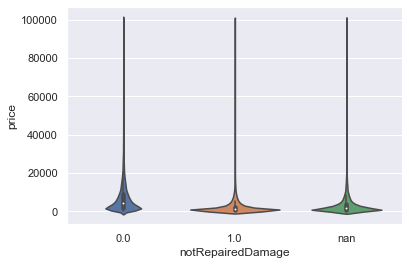

In [47]:
## 3) 小提琴图
catg_list = categorical_features
target = 'price'
for catg in catg_list :
    sns.violinplot(x=catg, y=target, data=Train_data)
    plt.show()

/home/xy/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:230: UserWarning: The `size` paramter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


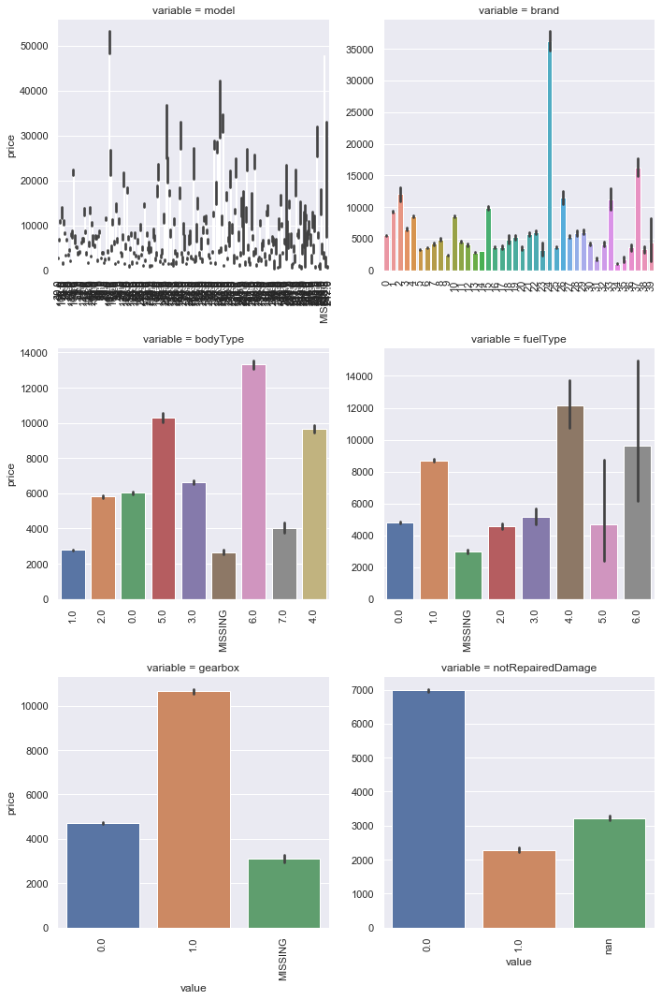

In [48]:
## 4) 柱形图
# Seaborn会对'color'列中的数值进行归类后按照estimator参数的方法（默认为平均值）计算相应的值，
# 计算出来的值就作为条形图所显示的值（条形图上的误差棒则表示各类的数值相对于条形图所显示的值的误差）
def bar_plot(x, y, **kwargs):
    sns.barplot(x=x, y=y)
    x=plt.xticks(rotation=90)

f = pd.melt(Train_data, id_vars=['price'], value_vars=categorical_features)
g = sns.FacetGrid(f, col="variable",  col_wrap=2, sharex=False, sharey=False, size=5)
g = g.map(bar_plot, "value", "price")

/home/xy/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:230: UserWarning: The `size` paramter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


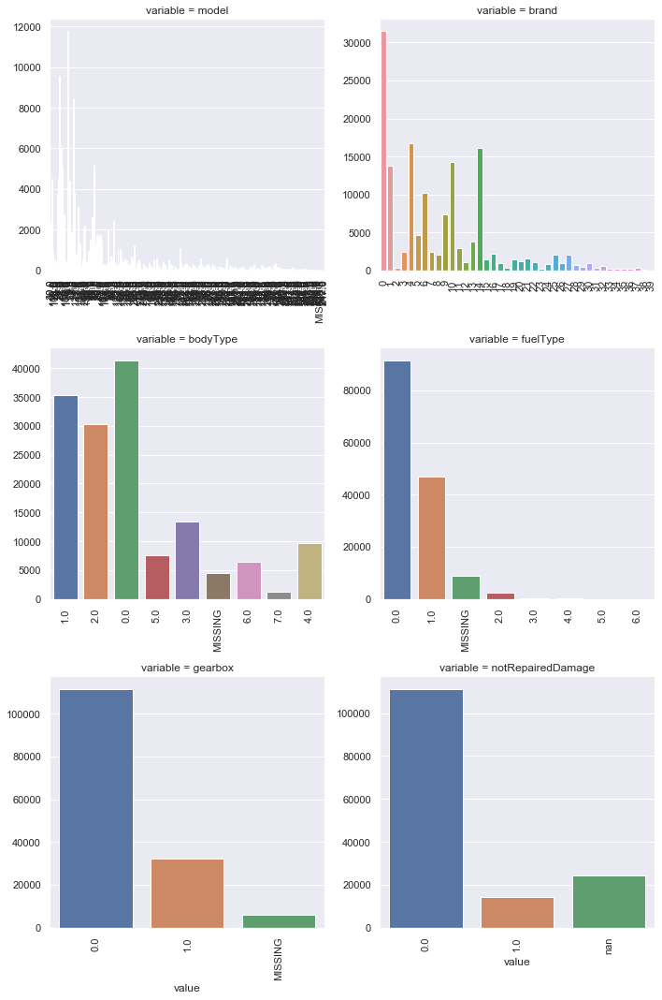

In [49]:
##  5) 频数(count_plot)
def count_plot(x,  **kwargs):
    sns.countplot(x=x)
    x=plt.xticks(rotation=90)

f = pd.melt(Train_data,  value_vars=categorical_features)
g = sns.FacetGrid(f, col="variable",  col_wrap=2, sharex=False, sharey=False, size=5)
g = g.map(count_plot, "value")

5. 输出报告

In [ ]:
import pandas_profiling
pfr = pandas_profiling.ProfileReport(Train_data)
pfr.to_file("./example.html")